In [2]:
!pip install rasterio
!pip install earthengine-api geemap
!pip install lightgbm
!pip install shapely
!pip install geopandas



In [4]:
pip install "numpy<2.0"


Note: you may need to restart the kernel to use updated packages.


In [6]:
# Standard Library Imports
from concurrent.futures import ThreadPoolExecutor, as_completed
from joblib import Parallel, delayed
from tqdm import tqdm
from datetime import datetime
from pathlib import Path
import os
import random

# Third-Party Imports
import ee
import geemap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from lightgbm import LGBMClassifier
from shapely.affinity import scale, translate
from skimage import exposure
from sklearn.metrics import classification_report, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder

from shapely import wkt
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')

import logging
# Set up a logger to capture Rasterio warnings
logging.getLogger("rasterio._env").setLevel(logging.ERROR)

In [8]:
# Define the root path for the project
root_path = Path(".")

In [10]:
# Authenticate with Google Earth Engine
# This opens a browser prompt for authentication, if not previously authenticated
ee.Authenticate()

# Initialize Earth Engine with a specific project
# Replace "project" with your project ID as needed
ee.Initialize(project="ee-isahildhiman13")

In [12]:
# Load training and testing datasets from CSV files
train = pd.read_csv("Test.csv")
test = pd.read_csv("Train.csv")

# Convert date columns in train
train["SDate"] = pd.to_datetime(train["SDate"], errors="coerce").dt.strftime('%d-%m-%Y')
train["HDate"] = pd.to_datetime(train["HDate"], errors="coerce").dt.strftime('%d-%m-%Y')

# Convert date columns in test
test["SDate"] = pd.to_datetime(test["SDate"], errors="coerce").dt.strftime('%d-%m-%Y')   #to make a date and time timestamp
test["HDate"] = pd.to_datetime(test["HDate"], errors="coerce").dt.strftime('%d-%m-%Y')

# Remove any rows where date conversion failed (optional)
train.dropna(subset=["SDate", "HDate"], inplace=True)
test.dropna(subset=["SDate", "HDate"], inplace=True)

# Save the cleaned data back
train.to_csv("fixed_train.csv", index=False)
test.to_csv("fixed_test.csv", index=False)

print("Date format correction completed.")
print("Cleaned train data saved as 'fixed_train.csv'.")
print("Cleaned test data saved as 'fixed_test.csv'.")

print("Date format correction completed. Cleaned data saved as 'fixed_dates.csv'.")


Date format correction completed.
Cleaned train data saved as 'fixed_train.csv'.
Cleaned test data saved as 'fixed_test.csv'.
Date format correction completed. Cleaned data saved as 'fixed_dates.csv'.


In [14]:
# Convert WKT (WELL KNOWN TEXT) geometry to actual geometry objects in both datasets
train['geometry'] = train['geometry'].apply(wkt.loads)  #        convert into a text represeting vector geometry.
test['geometry'] = test['geometry'].apply(wkt.loads)

In [16]:
# Convert pandas DataFrames to GeoDataFrames with CRS set to 'epsg:4326'
train = gpd.GeoDataFrame(train, crs='epsg:4326')
test = gpd.GeoDataFrame(test, crs='epsg:4326')

In [18]:
# Concatenate train and test datasets into a single DataFrame for consistent processing
# 'dataset' column distinguishes between train and test rows
data = pd.concat(
    [train.assign(dataset='train'), test.assign(dataset='test')]
).reset_index(drop=True)


In [20]:
# Function to scale each geometry around its centroid
def scale_geometry(geometry, scale_factor):
    """
    Scale a geometry object around its centroid.

    Parameters:
        geometry (shapely.geometry.base.BaseGeometry): Geometry to scale.
        scale_factor (float): Factor by which to scale the geometry.

    Returns:
        shapely.geometry.base.BaseGeometry: Scaled geometry object.
    """
    # Calculate centroid
    centroid = geometry.centroid
    # Translate geometry to origin
    translated_geometry = translate(geometry, -centroid.x, -centroid.y)
    # Scale geometry
    scaled_geometry = scale(translated_geometry, xfact=scale_factor, yfact=scale_factor, origin=(0, 0))
    # Translate back to the original centroid
    return translate(scaled_geometry, centroid.x, centroid.y)

In [22]:
# Set the scaling factor
scale_factor = 5

# Apply the scaling function to each geometry in the data
# This modifies each geometry in place by the defined scale factor
data['geometry'] = data['geometry'].apply(scale_geometry, scale_factor=scale_factor)

In [24]:
# Function to ensure date format is correct
def format_date(date_str):
    """Convert date string to 'YYYY-MM-DD' format."""
    try:
        return datetime.strptime(date_str, '%d-%m-%Y').strftime('%Y-%m-%d')
    except ValueError:
        print(f"Error: Invalid date format for {date_str}. Expected 'DD-MM-YYYY'.")
        return None

In [26]:
# Function to convert a GeoDataFrame to Google Earth Engine FeatureCollection
def gdf_to_gee(gdf):
    """Converts a GeoDataFrame to an Earth Engine FeatureCollection."""
    features = []
    for _, row in gdf.iterrows():
        geom = row['geometry'].__geo_interface__  # Convert geometry to GeoJSON format
        feature = ee.Feature(ee.Geometry(geom), row.to_dict())  # Create an EE Feature
        features.append(feature)
    return ee.FeatureCollection(features)

# Convert the entire dataset GeoDataFrame to a FeatureCollection for GEE
gee_feature_collection = gdf_to_gee(data)

In [28]:
# if you already downloaded the data.
download = False
# Initialize Earth Engine


# Remove existing 'downloads' folder if it exists
if os.path.exists('downloads'):
    os.system('rm -rf downloads')

# Ensure the output directory exists
output_folder = 'downloads'
os.makedirs(output_folder, exist_ok=True)

In [30]:
# def download_rgb_image(collection_name, bands, start_date, end_date, region, output_folder='downloads'):
#     """Download Sentinel-2 image with RGB bands + vegetation indices (NDVI, GNDVI, CIre, NDRE, PRI, MSAVI)."""

#     # Load image collection and filter by date and region
#     collection = ee.ImageCollection(collection_name).filterDate(start_date, end_date).filterBounds(region)
#     image = collection.sort('system:time_start', False).first().select(bands).clip(region)

#     # Vegetation Indices (using the correct bands)
#     ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')  # NIR (B8), Red (B4)
#     gndvi = image.normalizedDifference(['B8', 'B3']).rename('GNDVI')  # NIR (B8), Green (B3)

#     # CIre (Chlorophyll Index Red Edge) using B8 (NIR) and B5 (Red Edge 1)
#     cire = image.expression('(B8 / B5) - 1', {
#         'B8': image.select('B8'),  # NIR
#         'B5': image.select('B5')   # Red Edge 1
#     }).rename('CIre')

#     # NDRE (Normalized Difference Red Edge) using B8 (NIR) and B5 (Red Edge 1)
#     ndre = image.normalizedDifference(['B8', 'B5']).rename('NDRE')  # NIR (B8), Red Edge (B5)

#     # PRI (Photochemical Reflectance Index) using B5 (Red Edge 1) and B3 (Green)
#     pri = image.expression('(B5 - B3) / (B5 + B3)', {
#         'B5': image.select('B5'),   # Red Edge 1
#         'B3': image.select('B3')    # Green (B3)
#     }).rename('PRI')

#     # MSAVI (Modified Soil Adjusted Vegetation Index) using NIR (B8) and Red (B4)
#     msavi = image.expression(
#         '(2 * NIR + 1 - sqrt((2 * NIR + 1) ** 2 - 8 * (NIR - Red))) / 2', {
#             'NIR': image.select('B8'),  # NIR (B8)
#             'Red': image.select('B4')   # Red (B4)
#         }).rename('MSAVI')

#     # Add all indices as bands
#     image_with_indices = image.addBands([ndvi, gndvi, cire, ndre, pri, msavi])

#     # Unique name
#     image_id = image.id().getInfo() or f'image_{start_date}_{end_date}'
#     image_name = f'{output_folder}/{image_id}_RGB_INDICES_{start_date}_{end_date}.tif'

#     # Export the image
#     geemap.ee_export_image(
#         image_with_indices,
#         filename=image_name,
#         scale=10,
#         region=region,
#         file_per_band=False,
#         crs='EPSG:4326'
#     )
#     print(f"Downloaded with all indices: {image_name}")
#     return image_name


In [32]:
def download_rgb_image(collection_name, bands, start_date, end_date, region, output_folder='downloads', max_images=5):
    """Download up to 5 Sentinel-2 images with all default bands and computed vegetation indices."""

    # Load and filter the image collection
    collection = (ee.ImageCollection(collection_name)
                  .filterDate(start_date, end_date)
                  .filterBounds(region)
                  .sort('CLOUDY_PIXEL_PERCENTAGE'))

    # Limit to max_images
    images = collection.toList(max_images)
    downloaded_paths = []

    for i in range(max_images):
        try:
            image = ee.Image(images.get(i)).clip(region)

            # Compute vegetation indices
            ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
            gndvi = image.normalizedDifference(['B8', 'B3']).rename('GNDVI')
            cire = image.expression(
                '(B8 - B5) / B5', {
                    'B8': image.select('B8'),
                    'B5': image.select('B5')
                }).rename('CIre')
            ndre = image.normalizedDifference(['B8A', 'B5']).rename('NDRE')
            pri = image.expression(
                '(B531 - B570) / (B531 + B570)', {
                    'B531': image.select('B5'),  # Approx. 531nm
                    'B570': image.select('B3')   # Approx. 560nm
                }).rename('PRI')
            msavi = image.expression(
                '((2 * B8 + 1) - sqrt((2 * B8 + 1)**2 - 8 * (B8 - B4))) / 2', {
                    'B8': image.select('B8'),
                    'B4': image.select('B4')
                }).rename('MSAVI')

            # Combine original bands with indices
            full_image = image.select(bands).addBands([ndvi, gndvi, cire, ndre, pri, msavi])

            # Extract image ID for filename
            image_id = image.get('system:index').getInfo()
            if image_id is None:
                image_id = f"image_{i+1}"

            # Create filename
            filename = f"{image_id}_RGB_INDICES_{start_date}_{end_date}_img{i+1}.tif"
            out_path = os.path.join(output_folder, filename)

            # Export the image
            geemap.ee_export_image(
                full_image,
                filename=out_path,
                scale=10,
                region=region,
                file_per_band=False,
            )

            downloaded_paths.append(out_path)

        except Exception as e:
            print(f"Failed to download image {i+1}: {e}")

    return downloaded_paths


In [34]:
# def process_row(index, row):
#     # Format start and end dates
#     start_date = format_date(row['SDate'])
#     end_date = format_date(row['HDate'])

#     # Skip rows with invalid dates
#     if not start_date or not end_date:
#         print(f"Skipping entry due to invalid dates: SDate={row['SDate']}, HDate={row['HDate']}")
#         return index, None

#     # Extract and check geometry
#     region_geometry = row['geometry']
#     district = row['District']

#     # Verify valid geometry and convert it to EE format
#     if region_geometry.is_empty:
#         print(f"Skipping entry due to empty geometry for District: {district}")
#         return index, None

#     # Convert geometry type to EE compatible format
#     if region_geometry.geom_type == 'Polygon':
#         region = ee.Geometry.Polygon(region_geometry.__geo_interface__['coordinates'])
#     elif region_geometry.geom_type == 'MultiPolygon':
#         coords = [polygon.exterior.coords[:] for polygon in region_geometry.geoms]
#         region = ee.Geometry.MultiPolygon(coords)
#     else:
#         print(f"Skipping unsupported geometry type: {region_geometry.geom_type} for District: {district}")
#         return index, None

#     # Define Sentinel-2 collection and full band list in correct order
#     image_collection_name = 'COPERNICUS/S2_SR'  # Use S2_SR for surface reflectance
#     bands = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9']

#     # Attempt to download the image
#     try:
#         image_file = download_rgb_image(image_collection_name, bands, start_date, end_date, region, output_folder)
#         return index, image_file
#     except Exception as e:
#         print(f"Error processing entry for District {district}: {e}")
#         return index, None


In [36]:
def process_row(index, row):
    # Format start and end dates
    start_date = format_date(row['SDate'])
    end_date = format_date(row['HDate'])

    # Skip rows with invalid dates
    if not start_date or not end_date:
        print(f"Skipping entry due to invalid dates: SDate={row['SDate']}, HDate={row['HDate']}")
        return index, None

    # Extract geometry from row
    region_geometry = row['geometry']

    # Convert the geometry to an Earth Engine Geometry
    ee_geometry = ee.Geometry.Polygon(region_geometry.__geo_interface__['coordinates'])

    # Sentinel-2 band list: default bands (first 10) will be passed.
    # The function itself computes and appends the 6 vegetation indices.
    all_bands = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9']

    try:
        image_paths = download_rgb_image(
            collection_name='COPERNICUS/S2_SR',
            bands=all_bands,
            start_date=start_date,
            end_date=end_date,
            region=ee_geometry,
            output_folder='downloads',
            max_images=5
        )
        return index, image_paths
    except Exception as e:
        print(f"Error processing row {index}: {e}")
        return index, None


In [38]:
# download = True;
# if download:
#   # Execute image downloads for each row in parallel to improve performance
#   with ThreadPoolExecutor(max_workers=4) as executor:  # Adjust the number of workers as needed
#       futures = [executor.submit(process_row, index, row) for index, row in data.iterrows()]
#       for future in as_completed(futures):
#           index, image_file = future.result()
#           if image_file:
#               data.at[index, 'tif_path'] = image_file  # Store the downloaded file path
# else:
#   # Load existing data with image paths if downloads are not required
#   os.system('cp -r /content/drive/MyDrive/EarthEngineImages/downloads .')
#   data_path = "/content/drive/MyDrive/EarthEngineImages/data.csv"

#   data = pd.read_csv("/content/manifest-9c3e321cc2add60fb6c94a852921c61d20241125-3872-114kmzr.json")

In [ ]:
download = True
if download:
    # Prepare columns to store 5 image paths
    for i in range(1, 6):
        data[f'tif_path_{i}'] = None

    from concurrent.futures import ThreadPoolExecutor, as_completed
    # Execute image downloads for each row in parallel
    with ThreadPoolExecutor(max_workers=4) as executor:  # Adjust max_workers as needed
        futures = [executor.submit(process_row, index, row) for index, row in data.iterrows()]
        for future in as_completed(futures):
            index, image_files = future.result()
            if image_files:
                for i, path in enumerate(image_files):
                    if i < 5:
                        data.at[index, f'tif_path_{i+1}'] = path


C:\Users\Sahil\anaconda3\Lib\site-packages\ee\deprecation.py:207: DeprecationWarning: 

Attention required for COPERNICUS/S2_SR! You are using a deprecated asset.
To make sure your code keeps working, please update it.
Learn more: https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_SR

  warnings.warn(warning, category=DeprecationWarning)


Generating URL ...
Generating URL ...
Generating URL ...
Generating URL ...
Please wait ...
Please wait ...
Please wait ...
Data downloaded to C:\Users\Sahil\MLPR_labs\downloads\20240207T051001_20240207T052026_T44QKF_RGB_INDICES_2023-11-12_2024-05-14_img1.tif
Please wait ...
Generating URL ...
Data downloaded to C:\Users\Sahil\MLPR_labs\downloads\20240207T051001_20240207T052026_T44QKF_RGB_INDICES_2023-11-29_2024-05-18_img1.tif
Data downloaded to C:\Users\Sahil\MLPR_labs\downloads\20240207T051001_20240207T052026_T44QKF_RGB_INDICES_2023-12-20_2024-05-28_img1.tif
Data downloaded to C:\Users\Sahil\MLPR_labs\downloads\20230528T050659_20230528T051854_T44QKF_RGB_INDICES_2023-01-11_2024-04-27_img1.tif
Generating URL ...
Please wait ...
Please wait ...
Data downloaded to C:\Users\Sahil\MLPR_labs\downloads\20240427T050651_20240427T051439_T43QHA_RGB_INDICES_2023-11-12_2024-05-14_img2.tif
Data downloaded to C:\Users\Sahil\MLPR_labs\downloads\20240427T050651_20240427T051439_T43QHA_RGB_INDICES_2023-

In [47]:
import os

# Path to the 'downloads' folder in the current working directory
folder_path = './downloads'

# Count the number of .tif files in the folder
tif_files_count = len([file for file in os.listdir(folder_path) if file.endswith('.tif')])

# Print the result
print(f"Total number of .tif files in the 'downloads' folder: {tif_files_count}")


Total number of .tif files in the 'downloads' folder: 50587


In [ ]:
data.to_csv('output.csv', index=False)


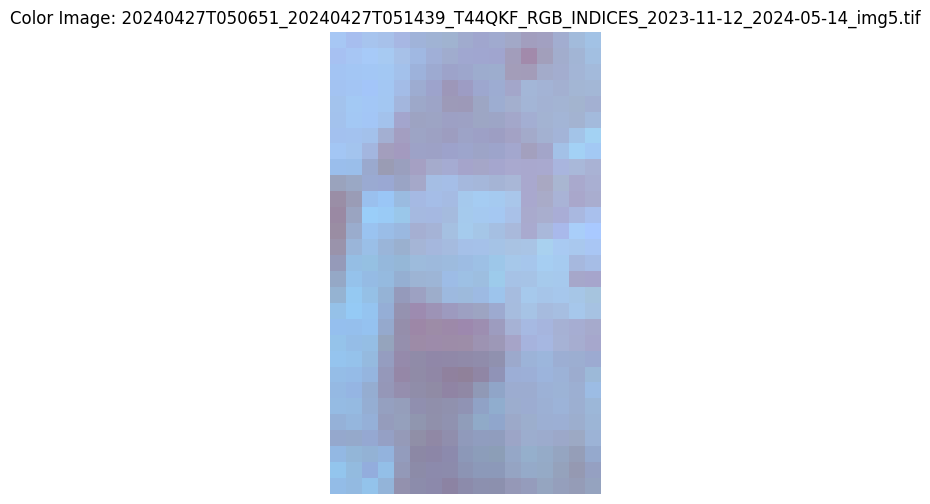

In [61]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import os

# Name of the .tif file to display (replace with your actual filename)
filename = '20240427T050651_20240427T051439_T44QKF_RGB_INDICES_2023-11-12_2024-05-14_img5.tif'  # Example: '123_RGB_INDICES_20220101_20220131_img1.tif'
file_path = os.path.join('downloads', filename)

# Open the .tif file using rasterio
with rasterio.open(file_path) as src:
    # Read the first 3 bands (assuming they are RGB)
    r = src.read(1)
    g = src.read(2)
    b = src.read(3)

    # Stack the bands into an RGB image and normalize to 0-1 for display
    rgb = np.stack([r, g, b], axis=-1)
    rgb = rgb.astype('float32')
    
    # Normalize if values are not already in range 0-1
    rgb /= np.max(rgb)

    # Display the image
    plt.figure(figsize=(10, 6))
    plt.imshow(rgb)
    plt.title(f"Color Image: {filename}")
    plt.axis('off')
    plt.show()
